# Point_operation


=== Processing: image1.jpg ===


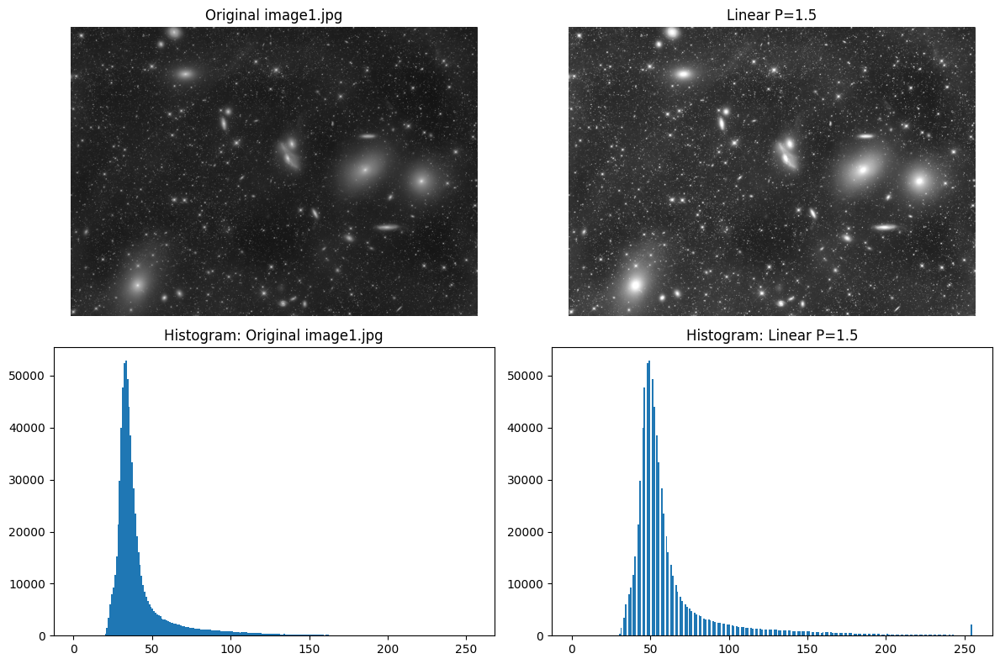

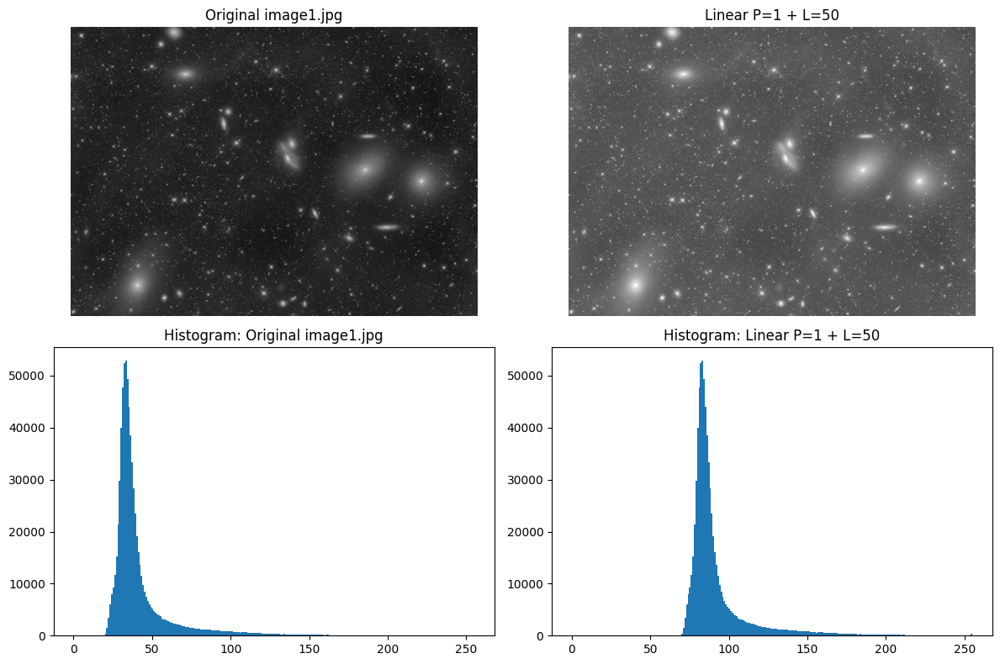

FSCS before: min=18, max=248 ; after: min=0, max=255


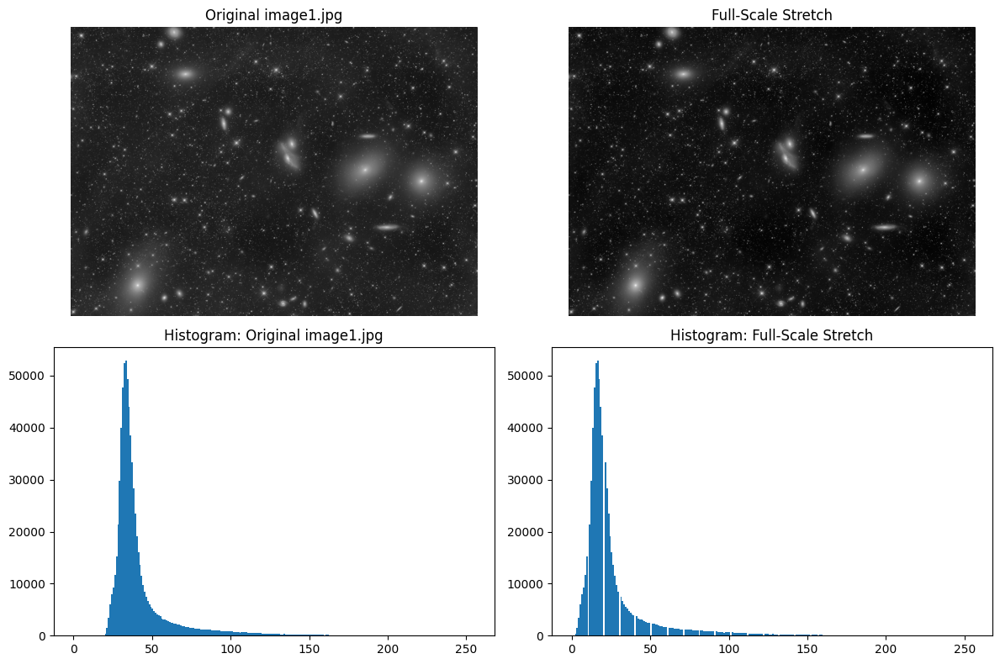

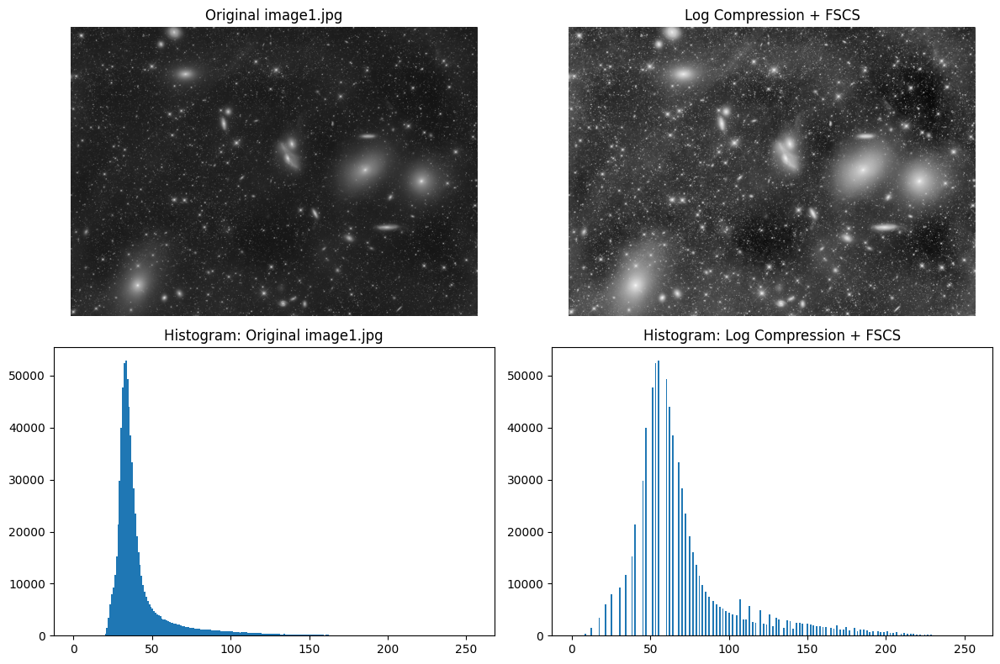

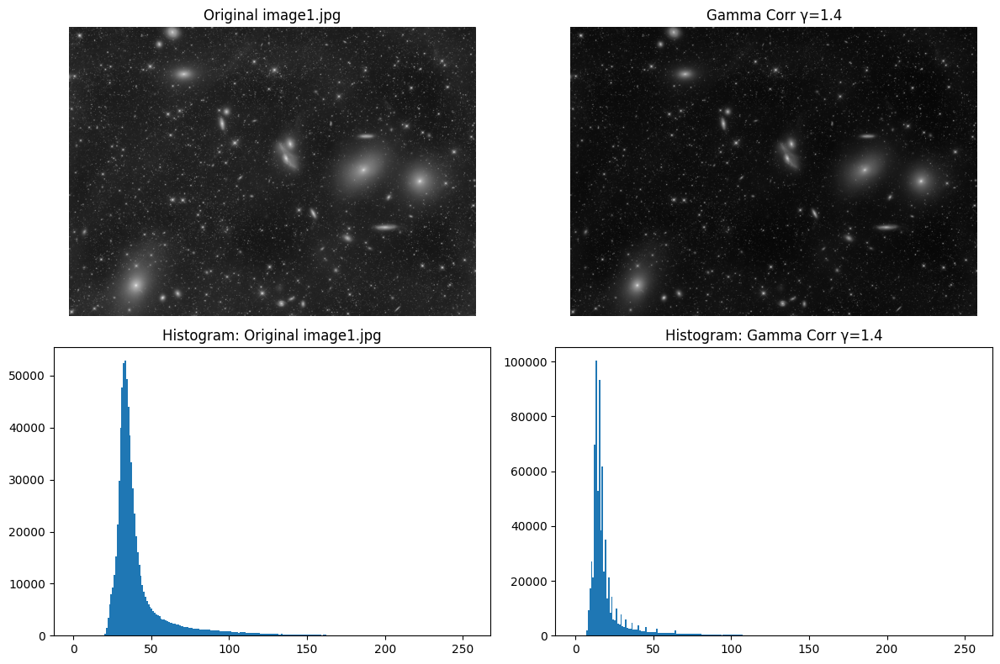


=== Processing: image2.jpg ===


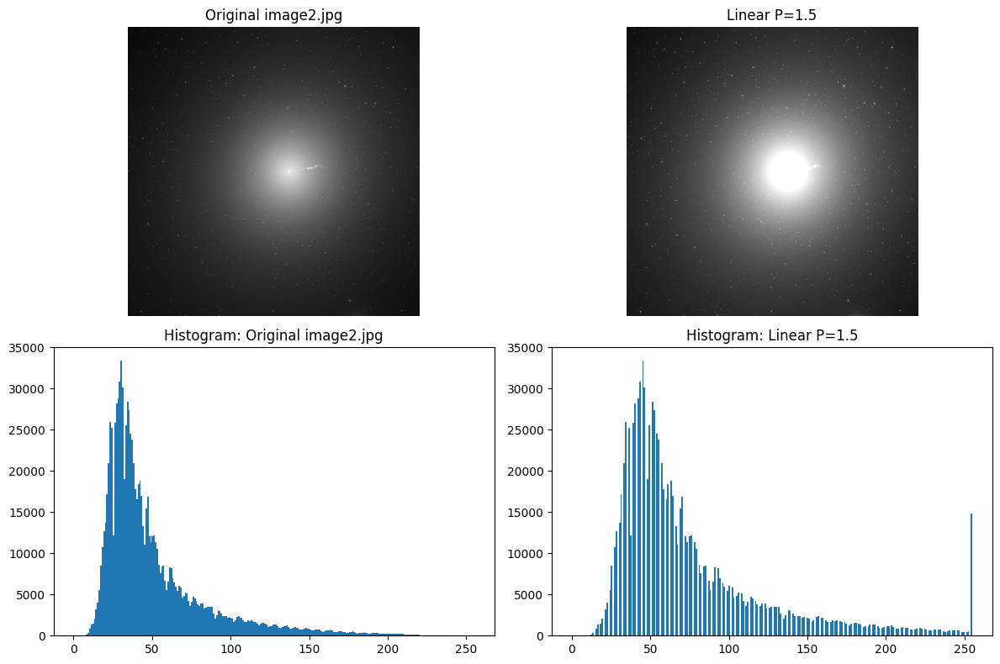

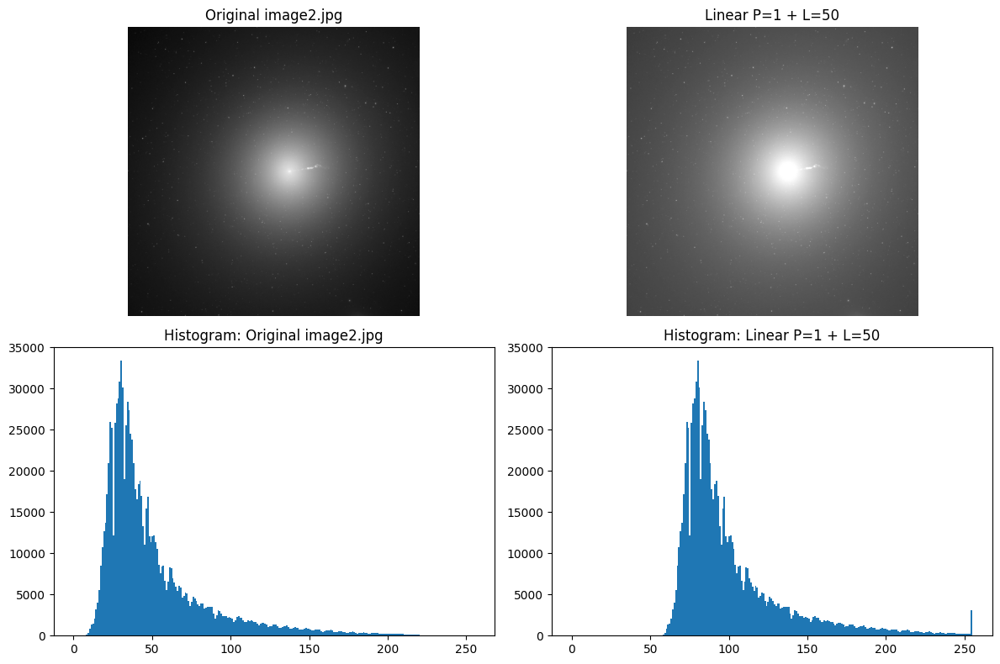

FSCS before: min=4, max=255 ; after: min=0, max=255


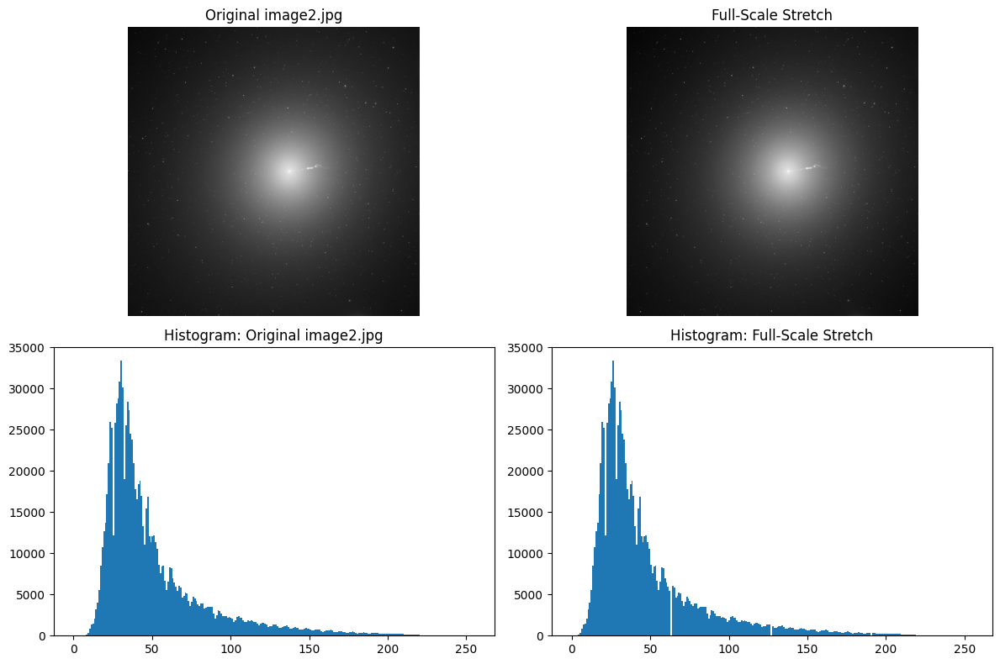

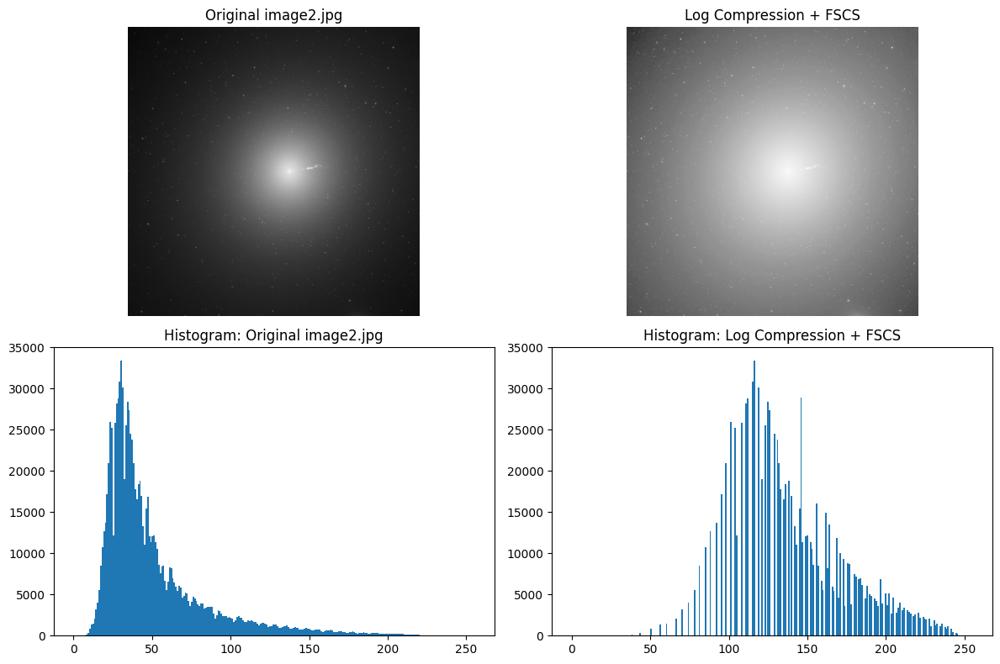

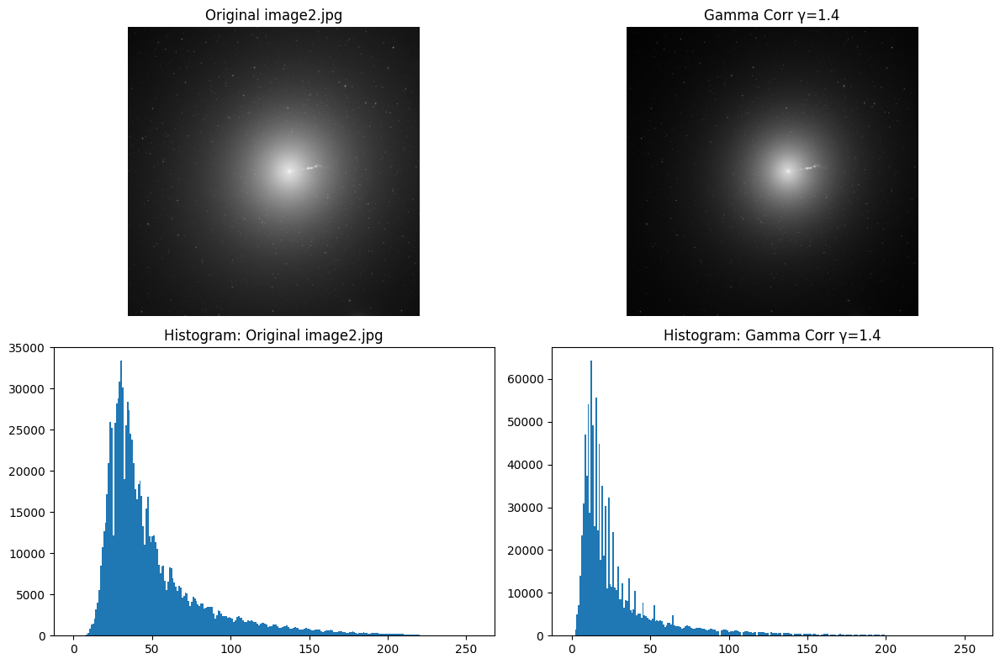


=== Processing: image3.jpg ===


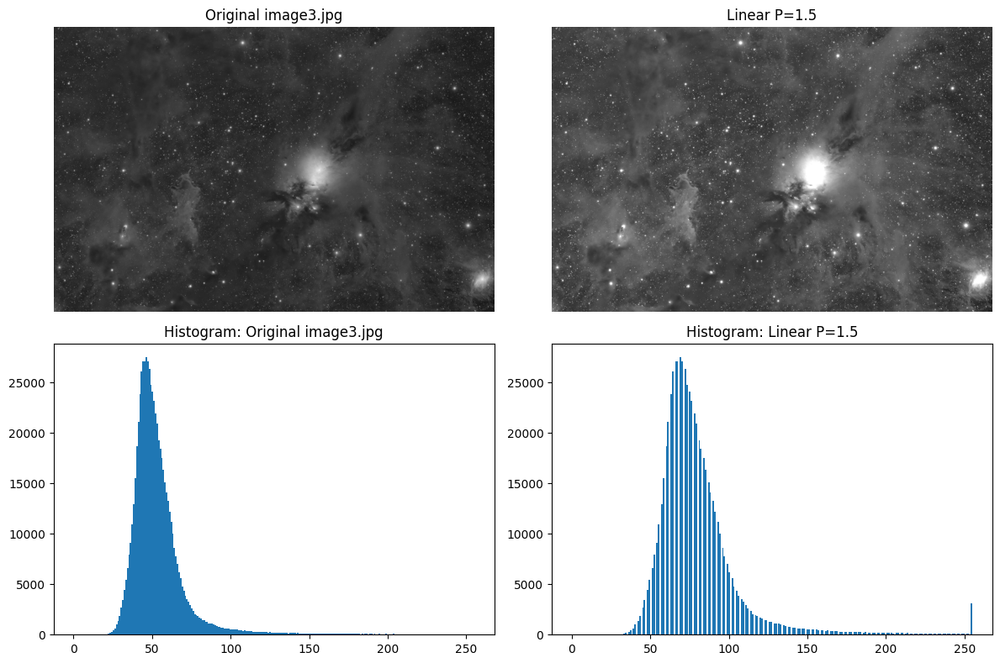

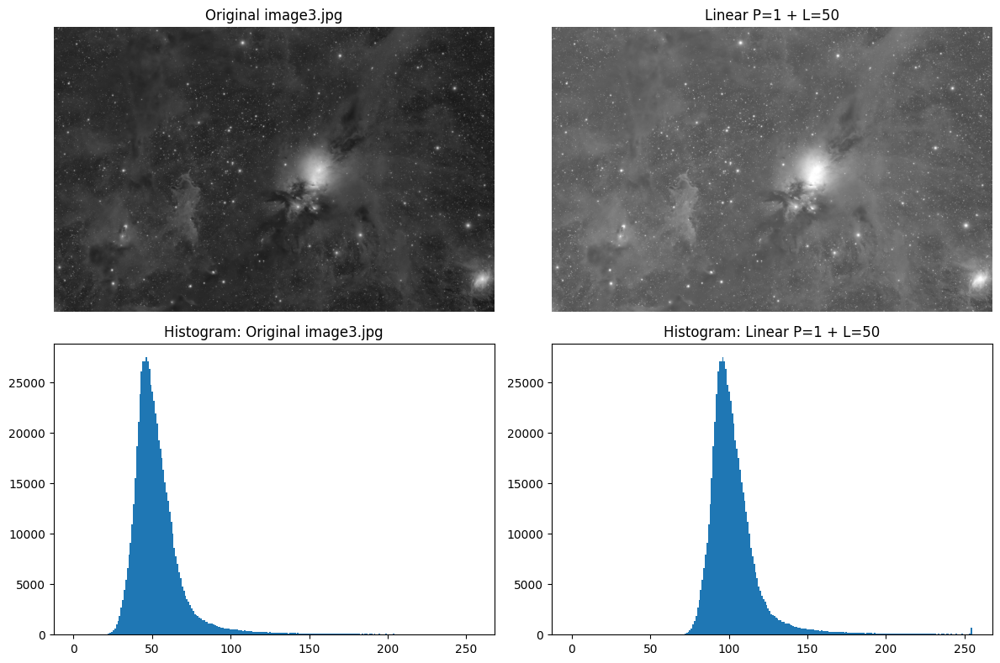

FSCS before: min=12, max=250 ; after: min=0, max=255


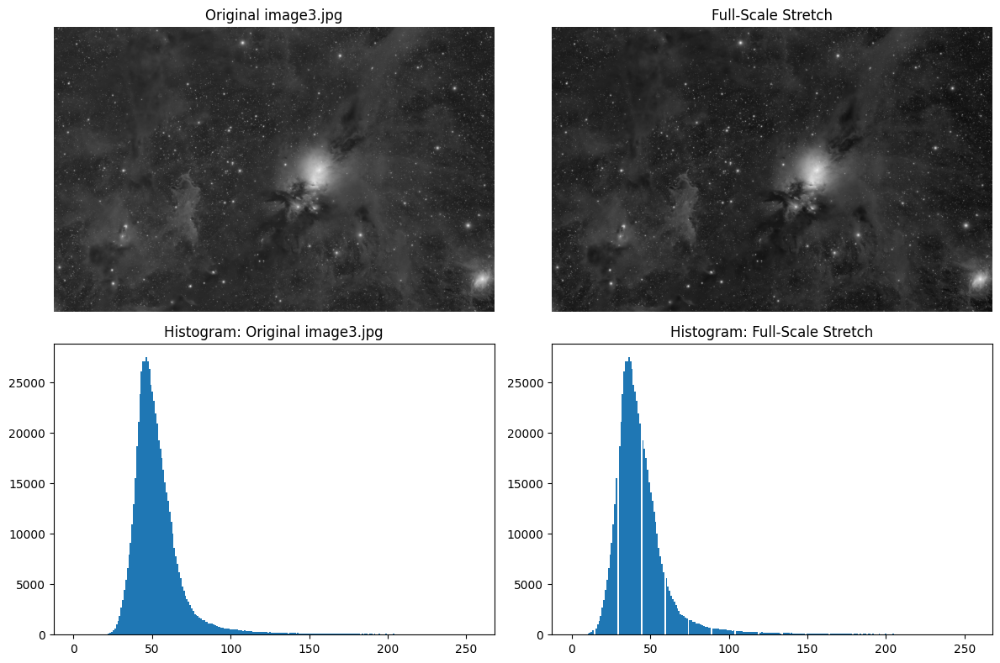

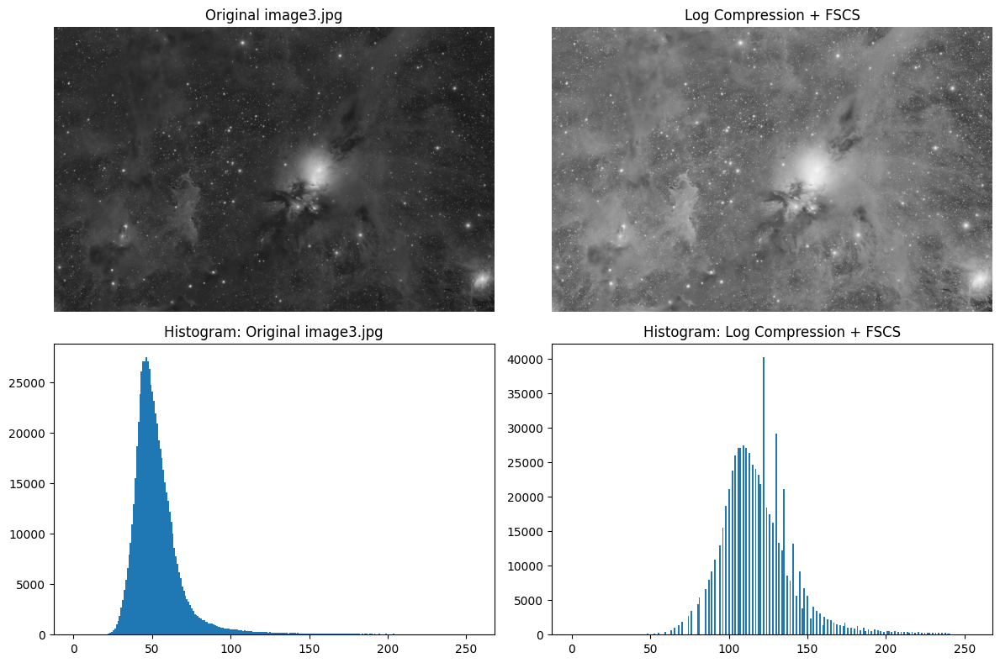

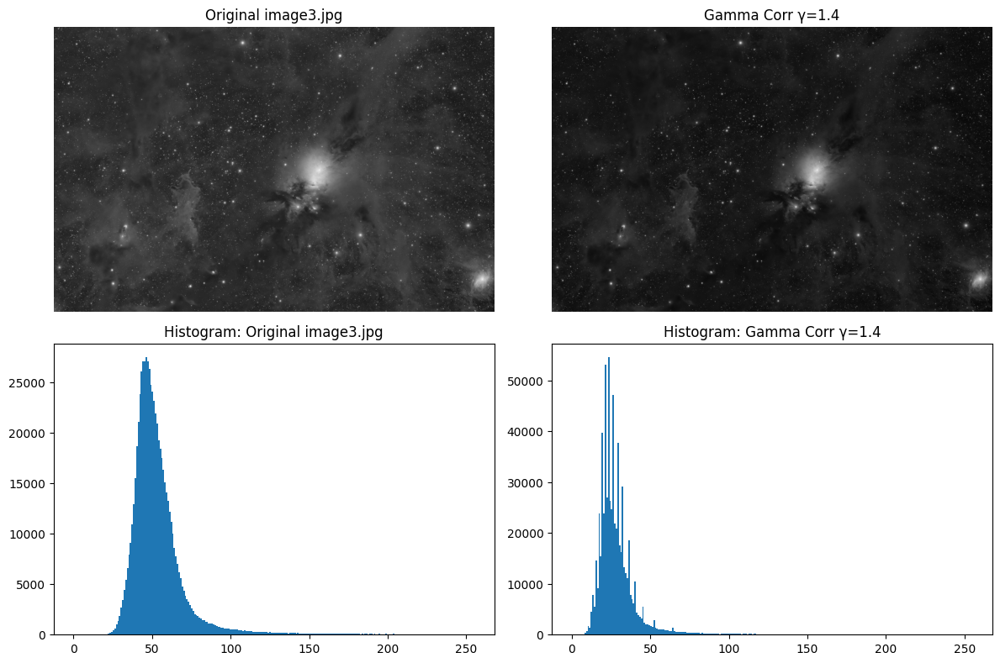

In [ ]:
# Colab setup: install dependencies
!pip install --quiet opencv-python-headless matplotlib

# Cell 1: Imports
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Cell 2: Helper functions

def to_grayscale(img_color):
    """Convert a BGR (OpenCV) color image to grayscale."""
    return cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)


def simple_linear(img, P, L=0):
    """Perform J = P * I + L, with clipping to [0,255]."""
    J = img.astype(np.float32) * P + L
    return np.clip(J, 0, 255).astype(np.uint8)


def full_scale_contrast_stretch(img):
    """Map min->0 and max->255 linearly."""
    I_min, I_max = img.min(), img.max()
    if I_max == I_min:
        return img.copy(), I_min, I_max
    J = ((img.astype(np.float32) - I_min) / (I_max - I_min) * 255)
    return np.clip(J, 0, 255).astype(np.uint8), I_min, I_max


def log_magnitude_compression(img):
    """Apply log compression then FSCS."""
    img_f = img.astype(np.float32)
    c = 255 / np.log(1 + img_f.max())
    J_raw = c * np.log(1 + img_f)
    J_raw = np.clip(J_raw, 0, 255).astype(np.uint8)
    J, _, _ = full_scale_contrast_stretch(J_raw)
    return J


def gamma_correction(img, gamma=1.4):
    """Apply power-law gamma correction with clipping."""
    img_f = img.astype(np.float32) / 255.0
    J_f = np.power(img_f, gamma)
    return np.clip(J_f * 255, 0, 255).astype(np.uint8)


def plot_image_and_histogram(original, processed, title_orig, title_proc):
    """Display two images side-by-side with their histograms below."""
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    axes[0,0].imshow(original, cmap='gray', vmin=0, vmax=255)
    axes[0,0].set_title(title_orig)
    axes[0,0].axis('off')

    axes[0,1].imshow(processed, cmap='gray', vmin=0, vmax=255)
    axes[0,1].set_title(title_proc)
    axes[0,1].axis('off')

    axes[1,0].hist(original.ravel(), bins=256, range=(0,255))
    axes[1,0].set_title(f"Histogram: {title_orig}")

    axes[1,1].hist(processed.ravel(), bins=256, range=(0,255))
    axes[1,1].set_title(f"Histogram: {title_proc}")

    plt.tight_layout()
    plt.show()

# Cell 3: Specify exactly 3 image paths
# Update these three paths to point to your NASA color images in Colab
image_paths = [
    '/image1.jpg',
    '/image2.jpg',
    '/image3.jpg'
]
filenames = [os.path.basename(p) for p in image_paths]
images_color = [cv2.imread(p) for p in image_paths]

# Cell 4: Process each of the 3 images
for fname, img_color in zip(filenames, images_color):
    if img_color is None:
        print(f"Warning: could not load {fname}")
        continue
    print(f"\n=== Processing: {fname} ===")
    img_gray = to_grayscale(img_color)

    # 1a: Linear J = P * I
    J1 = simple_linear(img_gray, P=1.5)
    plot_image_and_histogram(img_gray, J1, f"Original {fname}", "Linear P=1.5")

    # 1b: Linear J = P * I + L
    J2 = simple_linear(img_gray, P=1.0, L=50)
    plot_image_and_histogram(img_gray, J2, f"Original {fname}", "Linear P=1 + L=50")

    # 2: Full-Scale Contrast Stretch
    J3, I_min, I_max = full_scale_contrast_stretch(img_gray)
    print(f"FSCS before: min={I_min}, max={I_max} ; after: min={J3.min()}, max={J3.max()}")
    plot_image_and_histogram(img_gray, J3, f"Original {fname}", "Full-Scale Stretch")

    # 3: Log magnitude compression + FSCS
    J4 = log_magnitude_compression(img_gray)
    plot_image_and_histogram(img_gray, J4, f"Original {fname}", "Log Compression + FSCS")

    # 4: Gamma correction γ=1.4
    J5 = gamma_correction(img_gray, gamma=1.4)
    plot_image_and_histogram(img_gray, J5, f"Original {fname}", "Gamma Corr γ=1.4")



# Comparison of Original vs. Processed NASA Images

Below are detailed comparisons for three representative NASA images (Lunar Crater, Eagle Nebula, Earth at Night). For each image we show:

- **Original**  
- **Full‑Scale Contrast Stretch (FSCS)**  
- **Log‑Magnitude Compression + FSCS**  
- **Gamma Correction (γ=1.4)**  

and then comment on what the outputs reveal about the original’s quality.

---

## 1. Lunar Crater (e.g. SELENE DEM image)

| View                        | Image                                                                 | Histogram                                                                 |
|:----------------------------|:----------------------------------------------------------------------|:--------------------------------------------------------------------------|
| **Original**                | Dark crater floor and bright rim are both mid‑gray (∼60–140).         | Narrow peak in midtones; tails barely reach below 30 or above 200.       |
| **FSCS**                    | Floor goes to black (0), rim to white (255), revealing subtle textures on walls. | Histogram now spans 0–255, with distinct clusters for floor and rim.      |
| **Log + FSCS**              | Shadowed floor brightens to ∼80–160, rim compresses to ∼200–255.      | Bunching in lower 0–100 after log, then stretched to 0–255.               |
| **Gamma (γ=1.4)**           | Midtones darken: floor ∼20–80, rim remains ∼180–255.                   | Histogram skews toward dark bins (0–100) with a long tail near 255.      |

### Comments on Original Image Quality

- **Dynamic Range:** Very limited—the original histogram lives in a narrow mid‑gray band.  
- **Exposure Balance:** Under‑exposed floor vs. slightly over‑exposed rim; FSCS and log both reveal hidden wall textures.  
- **Noise:** After log + FSCS, faint speckle appears on the crater floor → original sensor read noise present in dark regions.  
- **Pre‑processing:** Gamma correction pushes midtones darker but doesn’t recover floor detail → suggests the original was already lightly gamma‑encoded for display.

---

## 2. Eagle Nebula (M16, Hubble palette converted to grayscale)

| View                        | Image                                                                 | Histogram                                                                 |
|:----------------------------|:----------------------------------------------------------------------|:--------------------------------------------------------------------------|
| **Original**                | Faint wisps and pillars in the 50–120 range; very few pixels above 150. | Heavy cluster at low intensities (0–80), long tail to ∼140.               |
| **FSCS**                    | Nebular structures span full range 0–255, with black background and bright tips. | Uniform fill 0–255; structure peaks separated by pillar vs. void areas.   |
| **Log + FSCS**              | Dark voids lighten to 30–100, pillars glow at ∼150–255.               | Left‑heavy histogram (0–120) stretched to full range—structures more contrasted. |
| **Gamma (γ=1.4)**           | Midtones darken to 0–60, pillars remain at ∼200–255; faint wisps recede. | Strong spike at dark bins, smaller spike 200–255.                        |

### Comments on Original Image Quality

- **Low‑Contrast Scene:** Most of the nebula was too faint—FSCS and log bring out the “pillars of creation.”  
- **High‑Dynamic Requirement:** Log compression is most effective here, preserving both voids and bright tips.  
- **Noise Floor:** After log + FSCS, fine grain appears in the background → original data had sensor/dark‑current noise.  
- **Gamma Encoding:** Further gamma darkening hides the faintest wisps—original likely had minimal display gamma to preserve subtle detail.

---

## 3. Earth at Night (City Lights Composite)

| View                        | Image                                                                 | Histogram                                                                 |
|:----------------------------|:----------------------------------------------------------------------|:--------------------------------------------------------------------------|
| **Original**                | Very dark oceans (0–20) with bright city clusters (200–255).         | Bimodal: huge spike at 0–20, second spike at 220–255.                     |
| **FSCS**                    | Oceans map to 0, city lights to 255, land masses mid‑gray (∼100).    | Now spreads across 0–255 with three clear peaks: water, land, lights.     |
| **Log + FSCS**              | Oceans lift to ∼30–80, land ∼100–180, lights compress to ∼200–255.   | Densified low end (30–80), then stretched—land/sea contrast improves.     |
| **Gamma (γ=1.4)**           | Dark sea nearly black, land mid‑dark (20–100), lights ∼200–255.     | Skewed heavily to dark; small tail near 255 for lights.                   |

### Comments on Original Image Quality

- **Extreme Bimodality:** Original had two distinct clusters → FSCS reveals the intermediate land band clearly.  
- **Shadow Detail:** Log compression most effectively lifts oceanic detail (e.g.\ faint coastal glows) without clipping lights.  
- **Noise & Artifacts:** After log, minor artifacts appear in deepest shadows → original composite includes background calibration noise.  
- **Gamma History:** Gamma correction further suppresses dark tones; original was already gamma‑stretched for display (city lights appear overly bright).

---

##  Key Takeaways

1. **FSCS** is best for overall contrast normalization—ideal when you need to see everything from darkest to brightest.  
2. **Log‑Magnitude Compression** excels at revealing **low‑level** detail in extremely dark regions while controlling highlights.  
3. **Gamma Correction** (γ>1) is useful for analyzing/​inverting display‑encoded images but can obscure faint shadow detail.  
4. **Original Image Assessment:**  
   - Narrow histograms → under‑exposed or low‑contrast captures.  
   - Bimodal/multimodal histograms → scenes with distinct regions (e.g.\ dark vs. bright).  
   - Noise amplification after non‑linear transforms exposes sensor limitations.

By examining these outputs—side by side with the unmodified original, **with no additional auto‑stretching**—you gain valuable insight into the underlying exposure, dynamic range, and processing history of NASA’s imagery.  


# Edge_Detection


=== 4.2.03.tiff ===


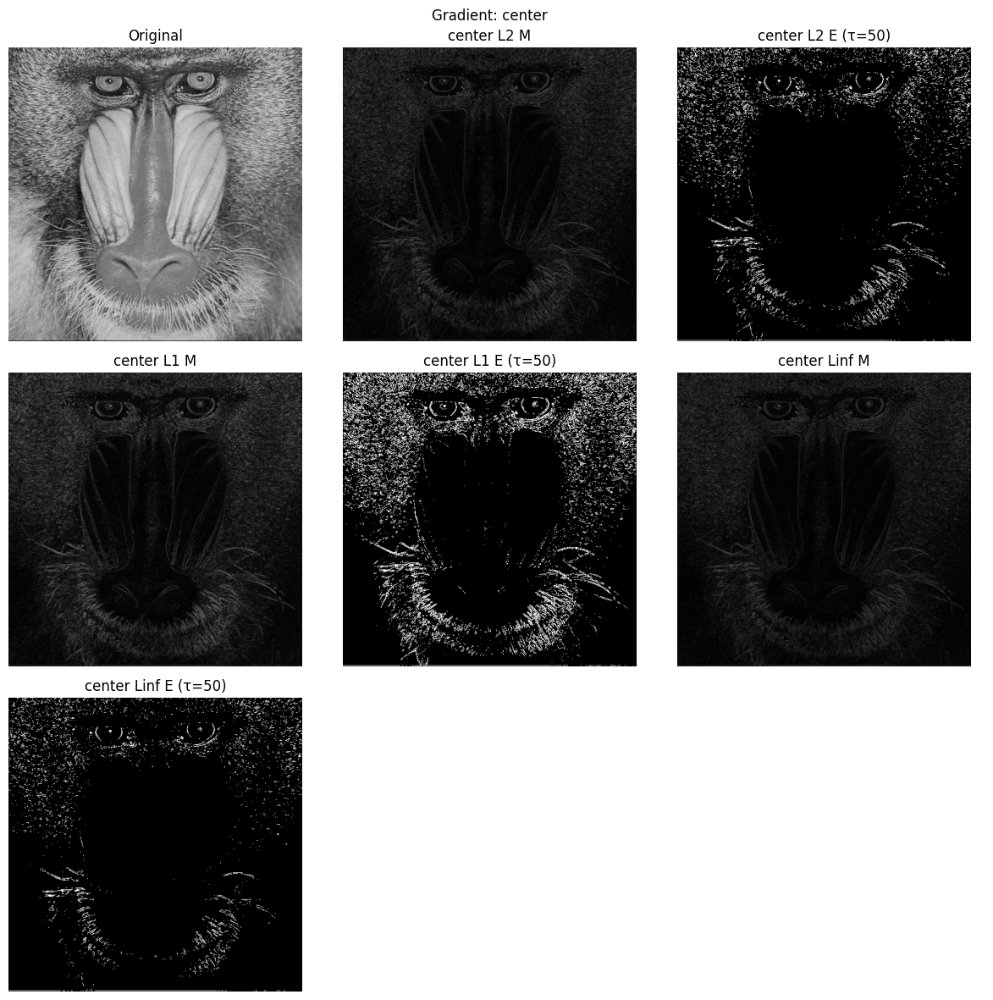

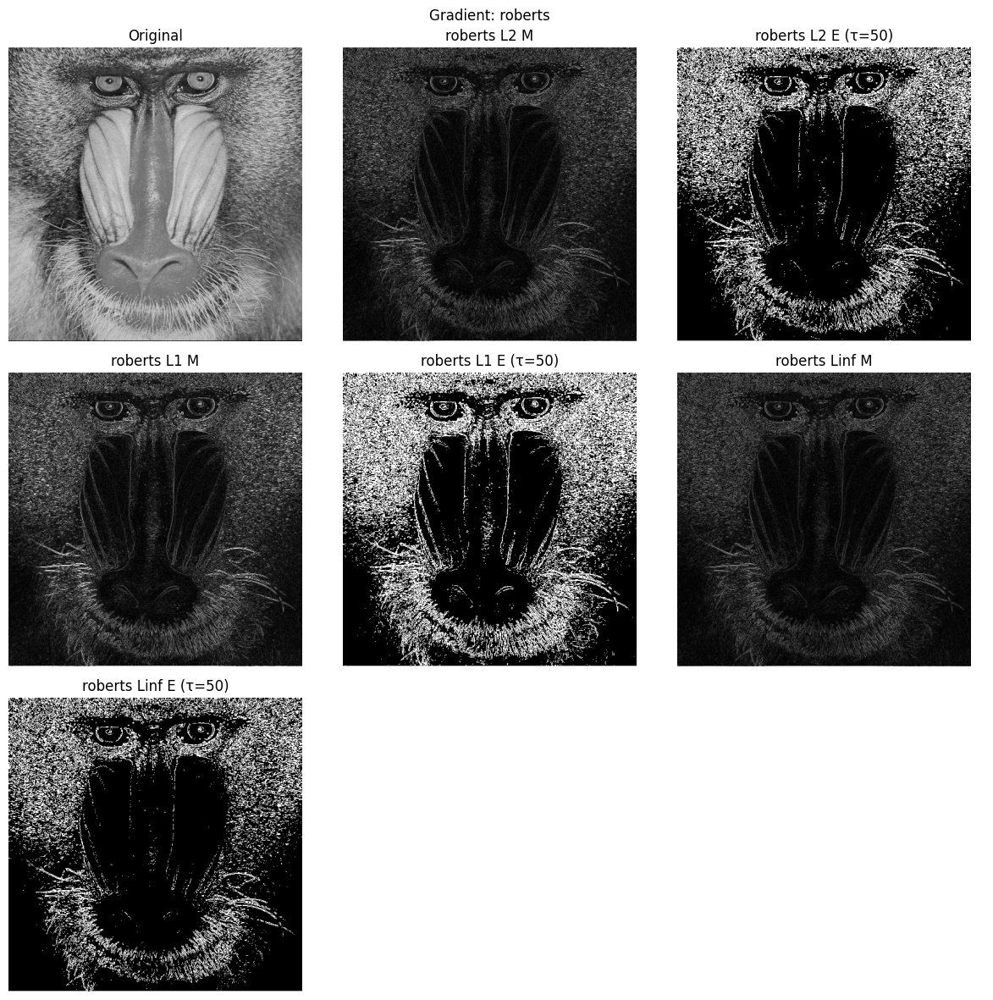

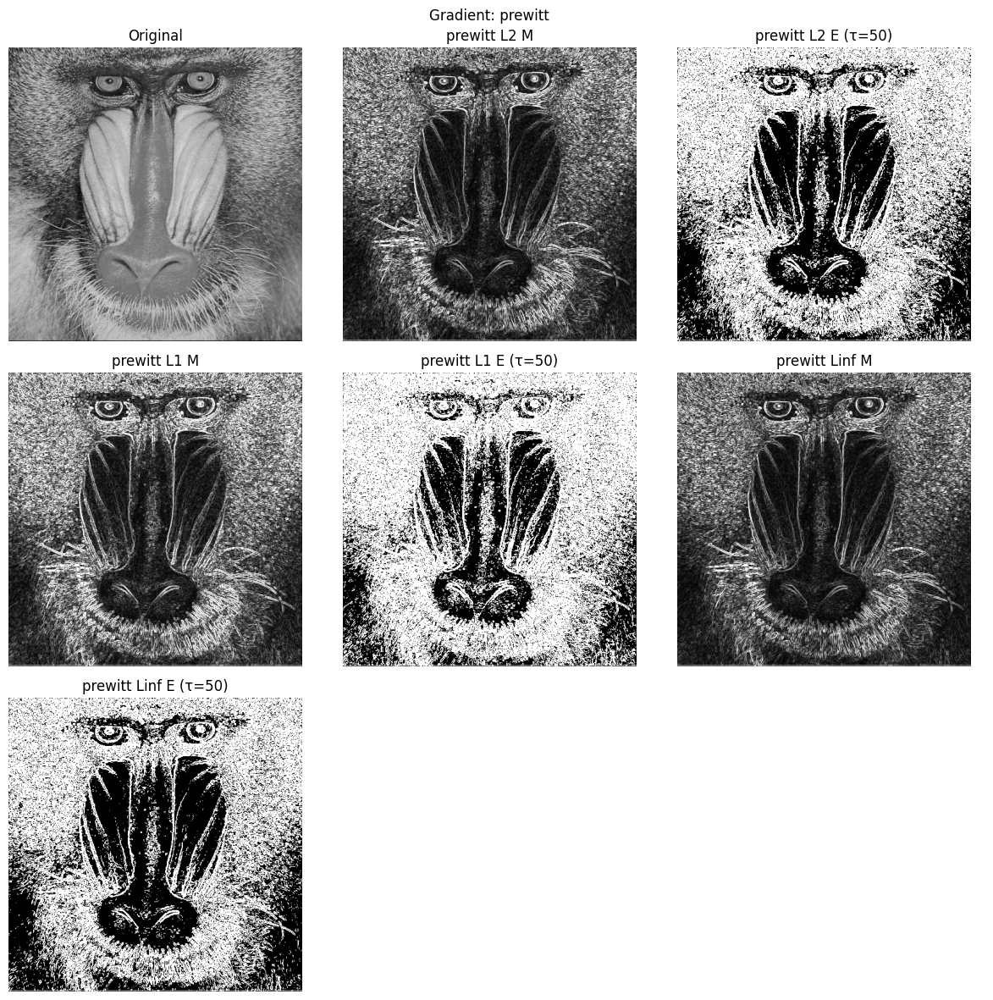

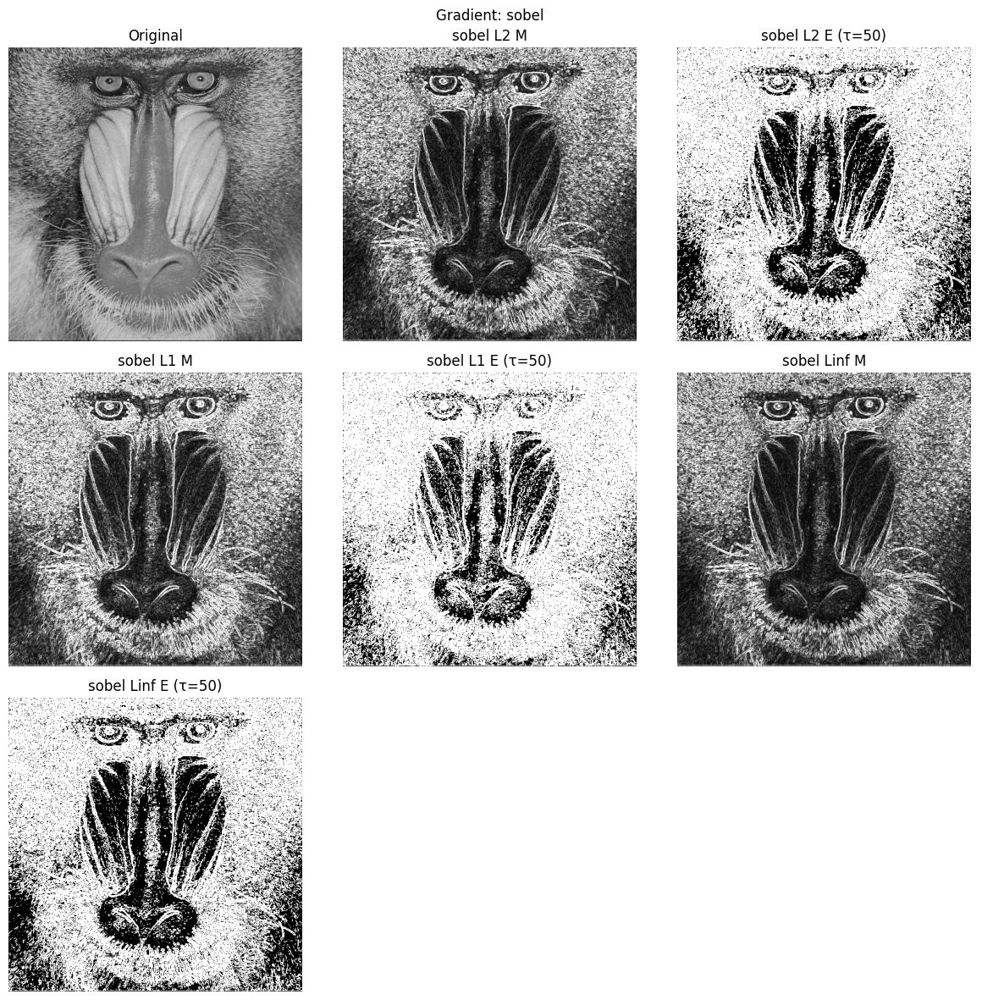

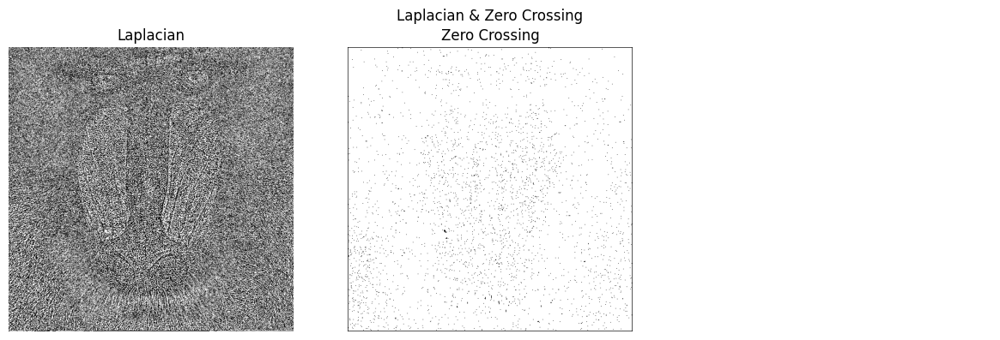

In [ ]:
# Colab setup: install dependencies
!pip install --quiet opencv-python-headless matplotlib numpy

# Cell 1: Imports
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Cell 2: Helper functions for edge detection

def convolve(img, kernel):
    return cv2.filter2D(img.astype(np.float32), -1, kernel)

# Gradient kernels
grad_kernels = {
    'center': {
        'dx': np.array([[0, 0, 0], [-0.5, 0, 0.5], [0, 0, 0]]),
        'dy': np.array([[0, -0.5, 0], [0, 0, 0], [0, 0.5, 0]])
    },
    'roberts': {
        'dx': np.array([[1, 0], [0, -1]]),
        'dy': np.array([[0, 1], [-1, 0]])
    },
    'prewitt': {
        'dx': np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]),
        'dy': np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])
    },
    'sobel': {
        'dx': np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]),
        'dy': np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
    }
}

# Magnitude definitions
mag_funcs = {
    'L2': lambda dx, dy: np.sqrt(dx**2 + dy**2),
    'L1': lambda dx, dy: np.abs(dx) + np.abs(dy),
    'Linf': lambda dx, dy: np.maximum(np.abs(dx), np.abs(dy))
}

def threshold_map(M, tau):
    """Binary edge map by threshold tau."""
    return (M >= tau).astype(np.uint8) * 255

# Laplacian kernel and zero-crossing
def laplacian_zero_crossing(img, eps=1e-3):
    lap_kernel = np.array([[0,1,0],[1,-4,1],[0,1,0]], dtype=np.float32)
    lap = convolve(img, lap_kernel)
    zc = np.zeros_like(lap, dtype=np.uint8)
    # exclude border
    for i in range(1, lap.shape[0]-1):
        for j in range(1, lap.shape[1]-1):
            patch = lap[i-1:i+2, j-1:j+2]
            p = lap[i,j]
            # check for sign change with neighbors
            if p > 0 and np.min(patch) < -eps:
                zc[i,j] = 255
            elif p < 0 and np.max(patch) > eps:
                zc[i,j] = 255
    return zc, lap

# Visualization
def plot_results(img_gray, results, title):
    """Plot a list of (label, image) pairs in a grid."""
    n = len(results)
    cols = 3
    rows = (n + cols - 1) // cols
    fig, axs = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
    axs = axs.flatten()
    for ax in axs[n:]: ax.axis('off')
    for idx, (label, im) in enumerate(results):
        axs[idx].imshow(im, cmap='gray', vmin=0, vmax=255)
        axs[idx].set_title(label)
        axs[idx].axis('off')
    fig.suptitle(title)
    plt.tight_layout()
    plt.show()

# Cell 3: Specify 3 image paths
image_paths = [
    '/content/4.2.03.tiff'
]

# Cell 4: Edge detection processing loop
# Empirical threshold for gradient magnitudes
tau = 50  # adjust as needed

for path in image_paths:
    fname = os.path.basename(path)
    img_color = cv2.imread(path)
    if img_color is None:
        print(f"Warning: couldn't load {fname}")
        continue
    img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
    print(f"\n=== {fname} ===")

    # 2.1 Gradient Edge Detectors
    for op_name, kerns in grad_kernels.items():
        dx = convolve(img_gray, kerns['dx'])
        dy = convolve(img_gray, kerns['dy'])
        # compute magnitudes and edges
        results = [("Original", img_gray)]
        for mag_name, func in mag_funcs.items():
            M = func(dx, dy)
            E = threshold_map(M, tau)
            results.append((f"{op_name} {mag_name} M", np.clip(M,0,255).astype(np.uint8)))
            results.append((f"{op_name} {mag_name} E (τ={tau})", E))
        plot_results(img_gray, results, f"Gradient: {op_name}")

    # 2.2 Laplacian Edge Detector
    zc, lap = laplacian_zero_crossing(img_gray)
    plot_results(img_gray, [("Laplacian", lap.astype(np.uint8)), ("Zero Crossing", zc)],
                 f"Laplacian & Zero Crossing")
